## Loading data

In this section we download all 4 parts of the dataset from Google Drive, unzip them and join together.

In [1]:
import gdown

In [12]:

url = "https://drive.google.com/file/d/18G0IAEzO-h7sPc1alAoV6C8S4zrtlbcq/view?usp=drive_link"
output = "part1.zip"
gdown.download(url, output, fuzzy=True)

Downloading...
From (original): https://drive.google.com/uc?id=18G0IAEzO-h7sPc1alAoV6C8S4zrtlbcq
From (redirected): https://drive.google.com/uc?id=18G0IAEzO-h7sPc1alAoV6C8S4zrtlbcq&confirm=t&uuid=e8c43aa2-a185-4314-adbf-ee2543d86ec3
To: /teamspace/studios/this_studio/part1.zip
100%|██████████| 8.46G/8.46G [01:15<00:00, 112MB/s] 


'part1.zip'

In [8]:
!mkdir dataset
!unzip -q part1.zip -d dataset

!cd './dataset/BarkNet 1.0 (Part 1 of  4)/' && mv ./* ../
!rm -r './dataset/BarkNet 1.0 (Part 1 of  4)/'

!rm part1.zip

In [3]:
url = "https://drive.google.com/file/d/1XTQ61W2EovrDBxg-0i3E_13VxolzDjIw/view?usp=drive_link"
output = "part2.zip"
gdown.download(url, output, fuzzy=True)

Downloading...
From (original): https://drive.google.com/uc?id=1XTQ61W2EovrDBxg-0i3E_13VxolzDjIw
From (redirected): https://drive.google.com/uc?id=1XTQ61W2EovrDBxg-0i3E_13VxolzDjIw&confirm=t&uuid=87cde7ab-f21c-4209-973f-ad2feffdffda
To: /teamspace/studios/this_studio/part2.zip
100%|██████████| 8.48G/8.48G [01:15<00:00, 112MB/s] 


'part2.zip'

In [ ]:
!unzip -q part2.zip -d dataset

!cd './dataset/BarkNet 1.0 (Part 2 of 4)' && mv ./* ../
!rm -r './dataset/BarkNet 1.0 (Part 2 of 4)/'

!rm part2.zip

In [7]:
url = "https://drive.google.com/file/d/1EUkB7kCJJ8NAX4A8EYws9KQvQ1mqviL6/view?usp=drive_link"
output = "part3.zip"
gdown.download(url, output, fuzzy=True)

Downloading...
From (original): https://drive.google.com/uc?id=1EUkB7kCJJ8NAX4A8EYws9KQvQ1mqviL6
From (redirected): https://drive.google.com/uc?id=1EUkB7kCJJ8NAX4A8EYws9KQvQ1mqviL6&confirm=t&uuid=dc5f4d9b-1c07-4ed4-a9a3-7b5e1f9d450b
To: /teamspace/studios/this_studio/part3.zip
100%|██████████| 6.70G/6.70G [00:55<00:00, 121MB/s] 


'part3.zip'

In [2]:
!unzip -oq part3.zip -d dataset

!rm part3.zip

In [3]:
url = "https://drive.google.com/file/d/1mTiQ3t5i0KAgKWgAVTjuGihiGrtobIMc/view?usp=drive_link"
output = "part4.zip"
gdown.download(url, output, fuzzy=True)

Downloading...
From (original): https://drive.google.com/uc?id=1mTiQ3t5i0KAgKWgAVTjuGihiGrtobIMc
From (redirected): https://drive.google.com/uc?id=1mTiQ3t5i0KAgKWgAVTjuGihiGrtobIMc&confirm=t&uuid=834ed115-d7f3-4b29-86b3-1260b3aaf4df
To: /teamspace/studios/this_studio/part4.zip
100%|██████████| 8.69G/8.69G [01:10<00:00, 123MB/s] 


'part4.zip'

In [6]:
!unzip -oq part4.zip -d dataset

!cd './dataset/BarkNet 1.0 (Part 4 of 4)/' && mv ./* ../
!rm -r './dataset/BarkNet 1.0 (Part 4 of 4)/'

!rm part4.zip

## Train / Val / Test split

In this section we split the dataset into 3 splits:
- **train** - 70% of the dataset (16469 images), used to train the model
- **val** - 10% of the dataset (2353 images), used to validate the model during training
- **test** - 20% of the dataset (4705 images), used to test the model after the training is completed

In [1]:
import os

In [2]:
DATASET_PATH = './dataset'

In [3]:
train = list(os.walk(DATASET_PATH)) # adjust depending on where you store the data
label_names = train[0][1]
dict_labels = dict(zip(label_names, list(range(len(label_names)))))
print(dict_labels)

{'BOJ': 0, 'BOP': 1, 'CHR': 2, 'EPB': 3, 'EPN': 4, 'EPO': 5, 'EPR': 6, 'ERB': 7, 'ERR': 8, 'ERS': 9, 'FRA': 10, 'HEG': 11, 'MEL': 12, 'ORA': 13, 'OSV': 14, 'PEG': 15, 'PET': 16, 'PIB': 17, 'PID': 18, 'PIR': 19, 'PRU': 20, 'SAB': 21, 'THO': 22}


In [4]:
import pathlib
from sklearn.model_selection import train_test_split
import numpy as np
import shutil
from PIL import Image
from tqdm.notebook import tqdm
import multiprocessing

Following the approach from the original article, we resize the source hi-res images to half of their original size in order to speedup the training.

In [5]:
def resize_image(source_path, dest_path):
    im = Image.open(source_path)
    original_width, original_height = im.size
    new_width = original_width // 2
    new_height = original_height // 2
    im_resized = im.resize((new_width, new_height), resample=Image.BILINEAR)
    im_resized.save(dest_path)

We perform a stratified train/val/test split: the proportions of images of a given class are the same across all splits. This will help us ensure that all classes are represented well during training/evaluation.

In [6]:
def split_dataset(source, dest_dir, split_ratio=(0.7, 0.1, 0.2)):
    os.makedirs(dest_dir, exist_ok=True)
    files = list([str(path) for path in pathlib.Path(source).rglob("./*/*")])
    classes = [str(f).split('/')[1] for f in files]

    X_train_val, X_test, y_train_val, y_test = train_test_split(files, classes, train_size=split_ratio[0] + split_ratio[1], random_state=42, stratify=classes)

    X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, train_size=split_ratio[0] / (split_ratio[0] + split_ratio[1]), random_state=42, stratify=y_train_val)

    for split, split_name in zip([X_train, X_val, X_test], ['train', 'val', 'test']):
        for label in np.unique(classes):
            os.makedirs(f"{dest_dir}/{split_name}/{label}", exist_ok=True)
        
        chunk_size = 6
        chunks = [split[i * chunk_size:(i + 1) * chunk_size] for i in range((len(split) + chunk_size - 1) // chunk_size )]  
        for chunk in tqdm(chunks):
            arguments = []
            for source_path in chunk:
                dest_path = pathlib.Path(f'{dest_dir}/{split_name}/', *pathlib.Path(source_path).parts[1:])
                arguments.append((source_path, dest_path))
            pool = multiprocessing.Pool()
            pool.starmap(resize_image, arguments)        

# split_dataset('./dataset', './dataset_split_full')

Additionally, we compute dataset statistics (mean and std) which will us perform image normalization during training / test phases.

In [7]:
def compute_mean_and_std(dataset_dir):
    files = list([str(path) for path in pathlib.Path(dataset_dir).rglob("./*/*") if str(path).endswith('.jpg')])
    count = 0
    mean = np.zeros(3)
    M2 = np.zeros(3)
    for path in tqdm(files):
        img = np.array(Image.open(path)) * 1. / 255
        count += 1
        delta = img.mean(axis=(0, 1)) - mean
        mean += delta / count
        delta2 = img.mean(axis=(0, 1)) - mean
        M2 += delta * delta2
    std = np.sqrt(M2 / (count - 1))
    return mean, std

# mean, std = compute_mean_and_std('./dataset_split_full')
# print('Mean:', mean)
# print('Std:', std)

In [8]:
DATASET_MEAN = np.array([0.47289732, 0.47306561, 0.43571059])
DATASET_STD = np.array([0.08474553, 0.07982154, 0.09903549])

## Training

Following the approach from the original article, we configure the datagenerators to crop random 224x224 regions from the original images for training. If the region is smaller than the desired size, we pad it with 0s.

We also apply horizontal flip augmentation to training images to improve training robustness.

Additionally, we perform data standartization (center the image values around mean with a unit standard deviation) using dataset statistics computed earlier. This technique should help improve convergence and make training stabler.

In [9]:
def random_crop_224(image):
    # Get the dimensions of the input image
    height, width, channels = image.shape

    # Calculate the maximum valid starting position for the top-left corner of the crop
    max_top = max(0, height - 224)
    max_left = max(0, width - 224)

    # Randomly choose the starting position of the crop
    top = np.random.randint(0, max_top + 1)
    left = np.random.randint(0, max_left + 1)

    # Calculate the ending position of the crop
    bottom = min(top + 224, height)
    right = min(left + 224, width)

    # Perform the crop
    cropped_image = image[top:bottom, left:right, :]

    # If the cropped region is smaller than 256x256, pad it with zeros
    if cropped_image.shape[0] < 224:
        pad_height = 224 - cropped_image.shape[0]
        cropped_image = np.pad(cropped_image, ((0, pad_height), (0, 0), (0, 0)), mode='constant')
    if cropped_image.shape[1] < 224:
        pad_width = 224 - cropped_image.shape[1]
        cropped_image = np.pad(cropped_image, ((0, 0), (0, pad_width), (0, 0)), mode='constant')

    normalized_image = (cropped_image * 1./255 - DATASET_MEAN) / DATASET_STD

    return normalized_image

We use batch size of 128.

In [10]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

image_size = (224, 224)
batch_size = 128

train_datagen = ImageDataGenerator(
    horizontal_flip = True,
    preprocessing_function=random_crop_224
)
val_datagen = ImageDataGenerator(
    preprocessing_function=random_crop_224
)

train_ds = train_datagen.flow_from_directory(
    './dataset_split_full/train',
    target_size = image_size,
    batch_size = batch_size,
    class_mode = 'categorical',
    subset = 'training',
    color_mode="rgb",
)
val_ds = val_datagen.flow_from_directory(
    './dataset_split_full/val',
    target_size = image_size,
    batch_size = batch_size,
    class_mode = 'categorical',
    subset = 'training',
    color_mode="rgb",
)

2024-04-29 08:16:03.540188: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-29 08:16:04.473467: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Found 16469 images belonging to 23 classes.
Found 2353 images belonging to 23 classes.


Here is an example of how 5 images in the batch look like after random crop and standartization have been applied to them:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


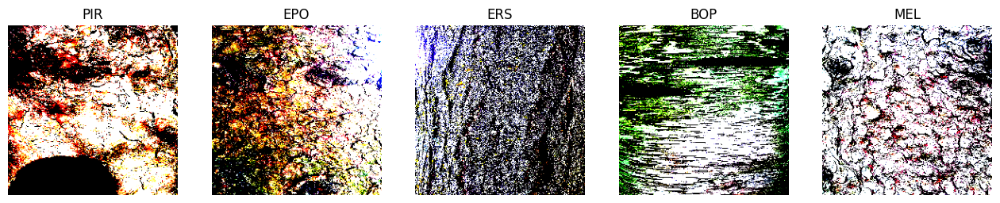

In [14]:
import matplotlib.pyplot as plt

index_to_class = {v:k for k,v in train_ds.class_indices.items()}

fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(16, 10))
plt.axis('off')

batch = next(train_ds)

for i in range(5):
    image = batch[0][i]
    label = batch[1][i]
    image = np.squeeze(image)
    ax[i].imshow(image)
    ax[i].axis(False)
    ax[i].title.set_text(index_to_class[np.argmax(label)])

In the original article, the authors have used resnet18 and resnet34 networks pretrained on ImageNet as a backbone. They have also frozen the first layer because the dataset was very different from ImageNet.

However, our experiments with using imagenet-pretrained weights did not produce a model with good accuracy, so we have trained a ResNet model from scratch instead. We have used a ResNet50 version because it's the smallest ResNet model avalable in keras.applications package.

This is how our model archireture looks like:
1. Input (224x224x3)
2. ResNet50 with an AveragePooling2D final layer
3. Dense layer with 1024 neurons and a ReLU activation function
4. Dropout layer with rate 0.2 
5. Dense layer with 23 neurons (number of classes) and a softmax activation function.

In [15]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, Model
from keras.applications.resnet50 import ResNet50
from tensorflow.keras.callbacks import ReduceLROnPlateau

## Option 1 - using weights pretrained on imagenet
# LAYERS_TO_UNFREEZE = 5
# res_base = ResNet50(weights = 'imagenet', include_top = False, input_shape = (224, 224, 3), pooling='avg')
# for layer in res_base.layers[:-LAYERS_TO_UNFREEZE]:
#     layer.trainable = False
# for layer in res_base.layers[-LAYERS_TO_UNFREEZE:]:
#     layer.trainable = True

## Option 2 - not using pretrained weights
res_base = ResNet50(weights = None, include_top = False, input_shape = (224, 224, 3), pooling='avg')


inputs = layers.Input(shape=(224, 224, 3))

x = res_base(inputs)
x = layers.Dense(1024, activation = 'relu')(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(len(train_ds.class_indices), activation = 'softmax')(x)
res_model = Model(inputs, outputs)
res_model.summary()

2024-04-28 20:16:04.084251: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1928] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20974 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:35:00.0, compute capability: 8.9


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 2048)           │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 23)             │        23,575 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,709,463 (98.07 MB)

 Trainable params: 25,656,343 (97.87 MB)

 Non-trainable params: 53,120 (207.50 KB)

We use Adam optimizer with a starting learning rate of 0.001. We also use a ReduceLROnPlateau callback to decrease the learning rate by half in case a validation loss is stale for at least 4 epochs.

We use Categorical Crossentropy as a loss and Categorical Accuracy as a metric to monitor.

In [16]:
res_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss=keras.losses.CategoricalCrossentropy(),
    metrics= [keras.metrics.CategoricalAccuracy()],
)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=0.00001)

In [17]:
epochs = 30
history = res_model.fit(train_ds, epochs=epochs, validation_data=val_ds, callbacks=[reduce_lr])

Epoch 1/30


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1714335394.540565   18845 service.cc:145] XLA service 0x7f38fc002cb0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1714335394.540605   18845 service.cc:153]   StreamExecutor device (0): NVIDIA L4, Compute Capability 8.9
2024-04-28 20:16:35.191599: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-04-28 20:16:37.417822: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8900
I0000 00:00:1

 66/129 ━━━━━━━━━━━━━━━━━━━━ 1:12 1s/step - categorical_accuracy: 0.1218 - loss: 3.9777

I0000 00:00:1714335515.689550   21086 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_16066', 96 bytes spill stores, 96 bytes spill loads

I0000 00:00:1714335515.784915   21083 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_15871', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714335515.907706   21086 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_16066', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714335516.349079   21081 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_16066', 1720 bytes spill stores, 2476 bytes spill loads

I0000 00:00:1714335516.874061   21083 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_16068', 72 bytes spill stores, 72 bytes spill loads

I0000 00:00:1714335517.19

129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - categorical_accuracy: 0.1606 - loss: 3.4798

I0000 00:00:1714335612.755425   22671 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1716', 20 bytes spill stores, 20 bytes spill loads

I0000 00:00:1714335612.802084   22670 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1716', 380 bytes spill stores, 380 bytes spill loads

I0000 00:00:1714335612.857992   22672 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1716', 856 bytes spill stores, 856 bytes spill loads

I0000 00:00:1714335633.275292   22955 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1709', 16 bytes spill stores, 16 bytes spill loads

I0000 00:00:1714335633.590037   22961 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1709', 4 bytes spill stores, 4 bytes spill loads

I0000 00:00:1714335633.62269

129/129 ━━━━━━━━━━━━━━━━━━━━ 269s 2s/step - categorical_accuracy: 0.1612 - loss: 3.4741 - val_categorical_accuracy: 0.2384 - val_loss: 2.5074 - learning_rate: 0.0010
Epoch 2/30
129/129 ━━━━━━━━━━━━━━━━━━━━ 179s 1s/step - categorical_accuracy: 0.4036 - loss: 1.8260 - val_categorical_accuracy: 0.2329 - val_loss: 3.0744 - learning_rate: 0.0010
Epoch 3/30
129/129 ━━━━━━━━━━━━━━━━━━━━ 181s 1s/step - categorical_accuracy: 0.4795 - loss: 1.5523 - val_categorical_accuracy: 0.3672 - val_loss: 2.2286 - learning_rate: 0.0010
Epoch 4/30
129/129 ━━━━━━━━━━━━━━━━━━━━ 183s 1s/step - categorical_accuracy: 0.5764 - loss: 1.2665 - val_categorical_accuracy: 0.3136 - val_loss: 2.4985 - learning_rate: 0.0010
Epoch 5/30
129/129 ━━━━━━━━━━━━━━━━━━━━ 185s 1s/step - categorical_accuracy: 0.6153 - loss: 1.1540 - val_categorical_accuracy: 0.3651 - val_loss: 2.5209 - learning_rate: 0.0010
Epoch 6/30
129/129 ━━━━━━━━━━━━━━━━━━━━ 176s 1s/step - categorical_accuracy: 0.6576 - loss: 1.0356 - val_categorical_accuracy:

In [18]:
res_model.save('bark-full-no-resnet-dense1024-dropout02-40epochs.hdf5')

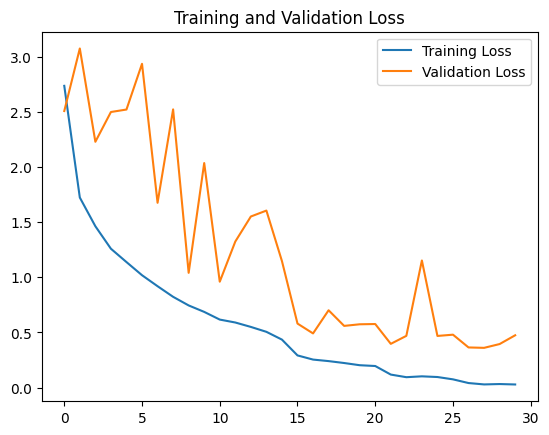

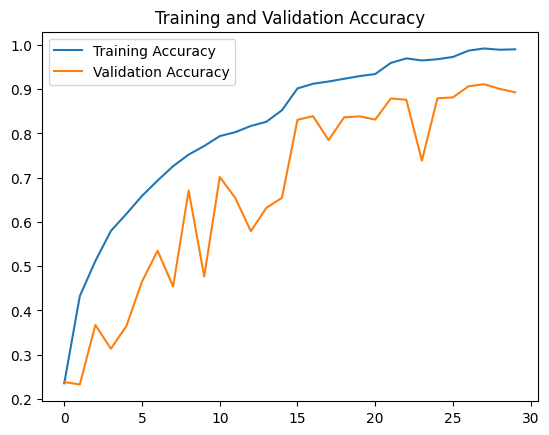

In [19]:
#Plots to visualize :

# Extract training and validation loss/accuracy from history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['categorical_accuracy']
val_acc = history.history['val_categorical_accuracy']

# Plot training and validation loss
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Plot training and validation accuracy
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

# Evaluation

In [11]:
from tensorflow.keras.models import load_model

model = load_model('./bark-full-no-resnet-dense1024-dropout02-40epochs.hdf5')
model.summary()

2024-04-29 08:16:20.515792: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1928] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20974 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:35:00.0, compute capability: 8.9


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 2048)           │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 23)             │        23,575 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,709,465 (98.07 MB)

 Trainable params: 25,656,343 (97.87 MB)

 Non-trainable params: 53,120 (207.50 KB)

 Optimizer params: 2 (12.00 B)

In [12]:
import numpy as np
from tensorflow import keras
import logging
import matplotlib.patches as patches
import matplotlib.pyplot as plt

  0%|          | 0/295 [00:00<?, ?it/s]

I0000 00:00:1714378598.439403    3724 service.cc:145] XLA service 0x7ff75c0023c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1714378598.439541    3724 service.cc:153]   StreamExecutor device (0): NVIDIA L4, Compute Capability 8.9
2024-04-29 08:16:38.495202: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-04-29 08:16:38.902546: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8900
I0000 00:00:1714378599.835677    4039 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1368', 460 bytes spill stores, 348 bytes spill loads

I0000 00:00:1714378599.990152    4041 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1368', 960 bytes spill stores, 624 bytes spill loads

I0000 00:00:17143786

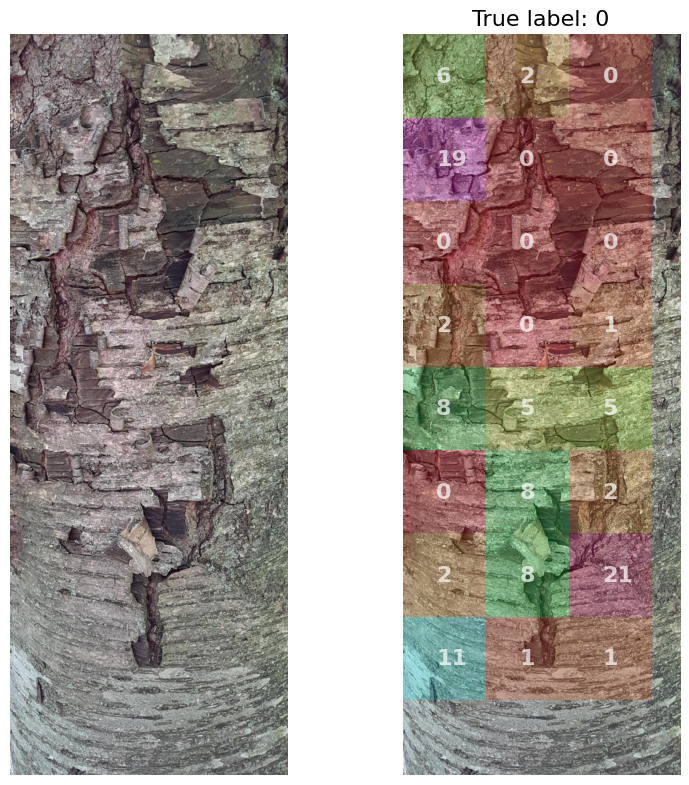

I0000 00:00:1714378605.036848    4224 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1368', 380 bytes spill stores, 380 bytes spill loads

I0000 00:00:1714378607.776612    4322 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1361', 244 bytes spill stores, 244 bytes spill loads

I0000 00:00:1714378608.038490    4317 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1368', 960 bytes spill stores, 624 bytes spill loads

I0000 00:00:1714378608.257805    4320 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1368', 460 bytes spill stores, 348 bytes spill loads

I0000 00:00:1714378610.887397    4478 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1368', 460 bytes spill stores, 348 bytes spill loads

I0000 00:00:17143786

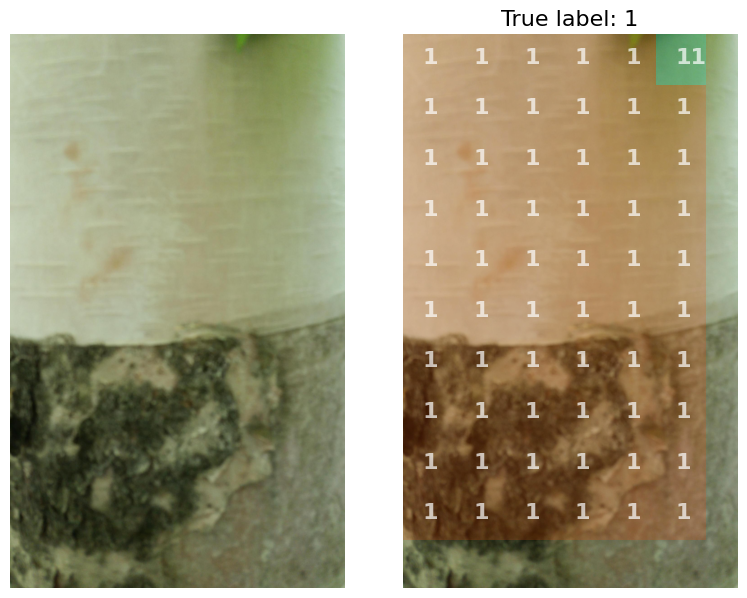

I0000 00:00:1714378745.947338   15951 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1368', 460 bytes spill stores, 348 bytes spill loads

I0000 00:00:1714378746.156967   15947 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1368', 960 bytes spill stores, 624 bytes spill loads

I0000 00:00:1714378746.313665   15941 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1361', 244 bytes spill stores, 244 bytes spill loads

I0000 00:00:1714378749.452436   16157 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1368', 460 bytes spill stores, 348 bytes spill loads



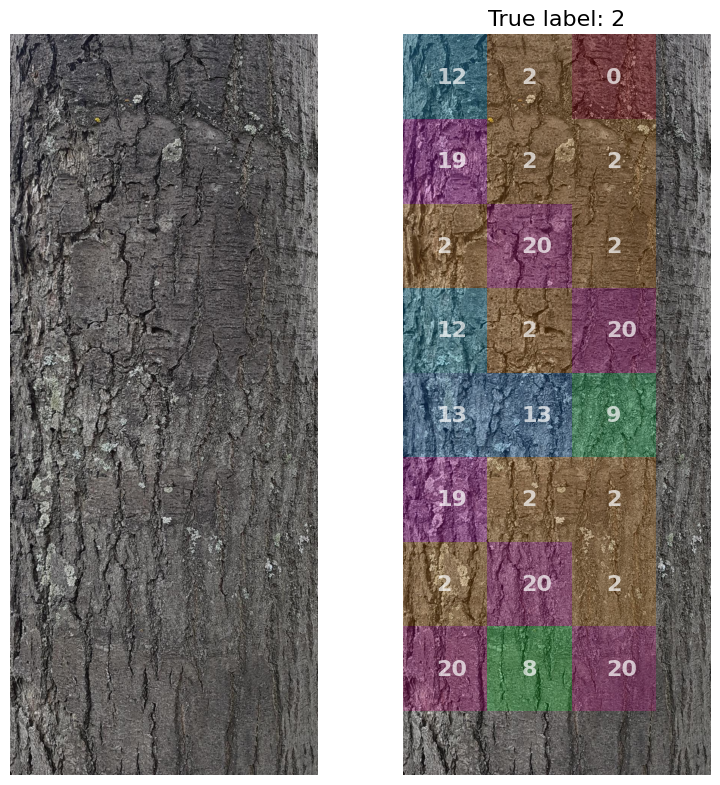

2024-04-29 08:20:27.365546: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
ERROR:root:local variable 'batch_outputs' referenced before assignment


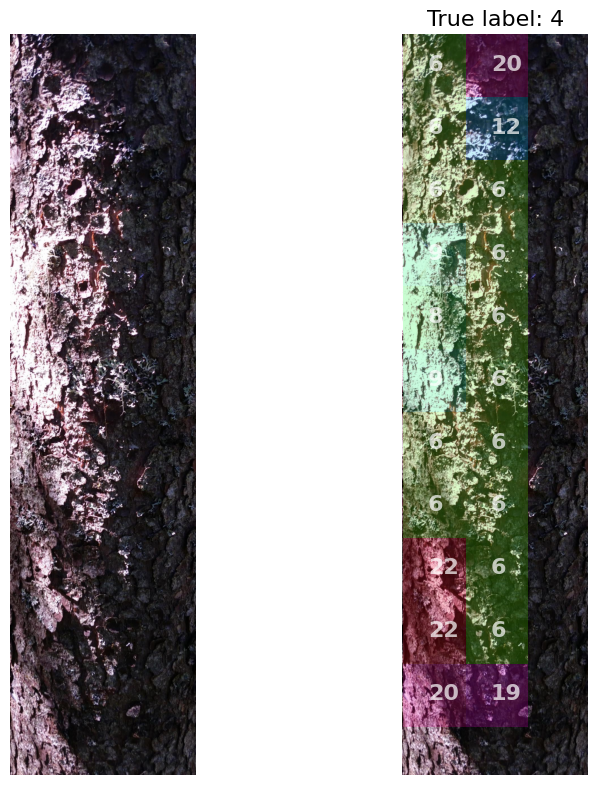

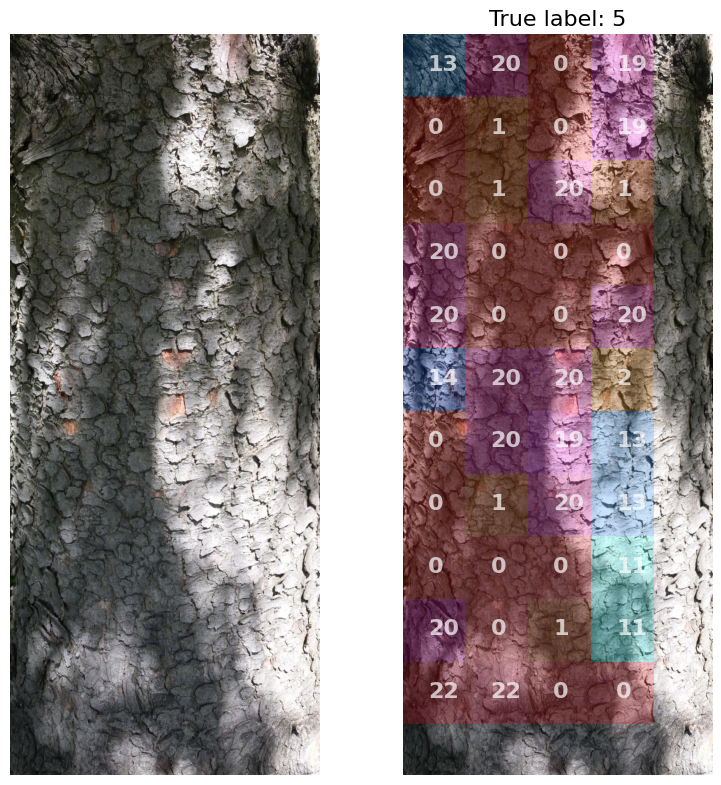

ERROR:root:local variable 'batch_outputs' referenced before assignment
2024-04-29 08:24:13.570612: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
ERROR:root:local variable 'batch_outputs' referenced before assignment
2024-04-29 08:24:13.600558: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
ERROR:root:local variable 'batch_outputs' referenced before assignment
2024-04-29 08:24:13.629364: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2024-04-29 08:24:13.657792: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
ERROR:root:local variable 'batch_outputs' referenced before assignment
ERROR:root:local variable 'batch_outputs' referenced before assignment
2024-04-29 08:24:13.736808: W ten

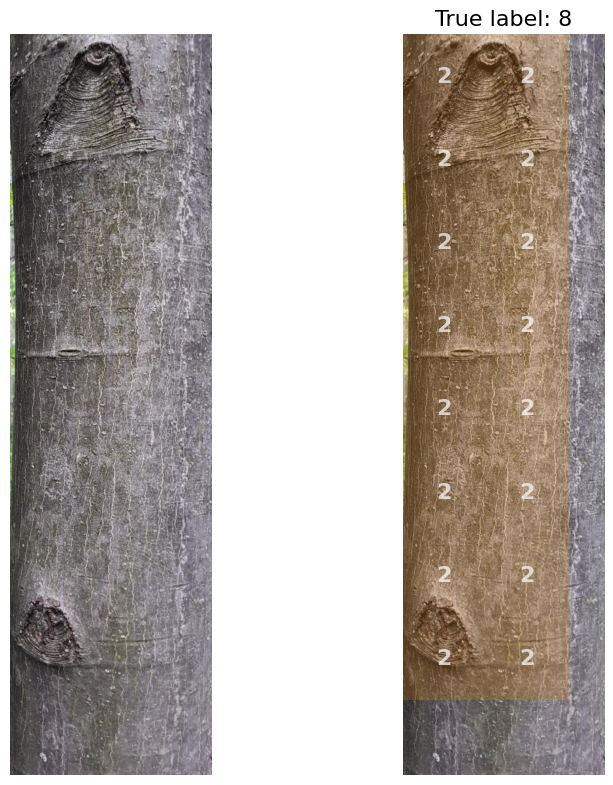

ERROR:root:local variable 'batch_outputs' referenced before assignment
2024-04-29 08:25:20.506215: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


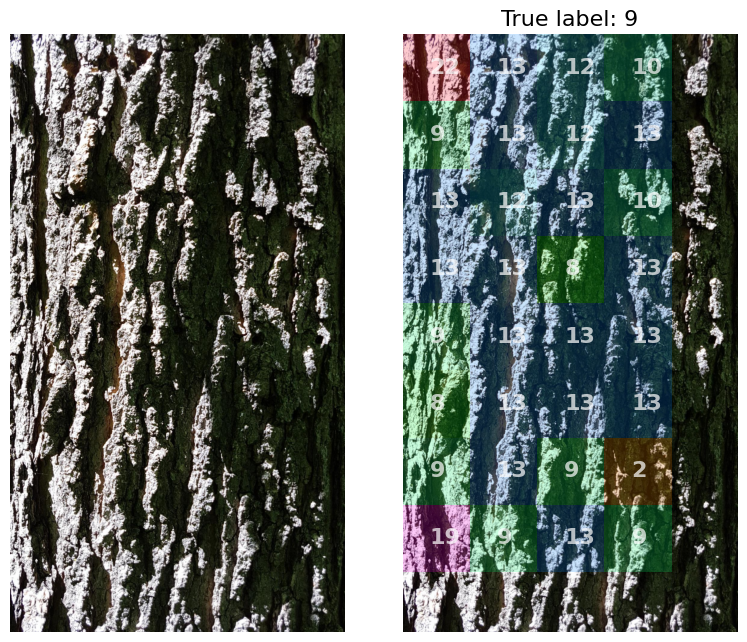

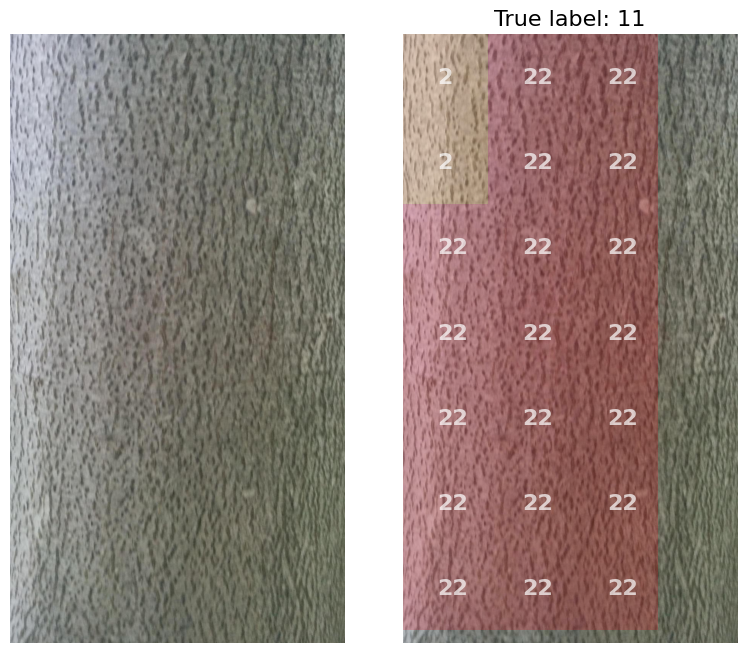

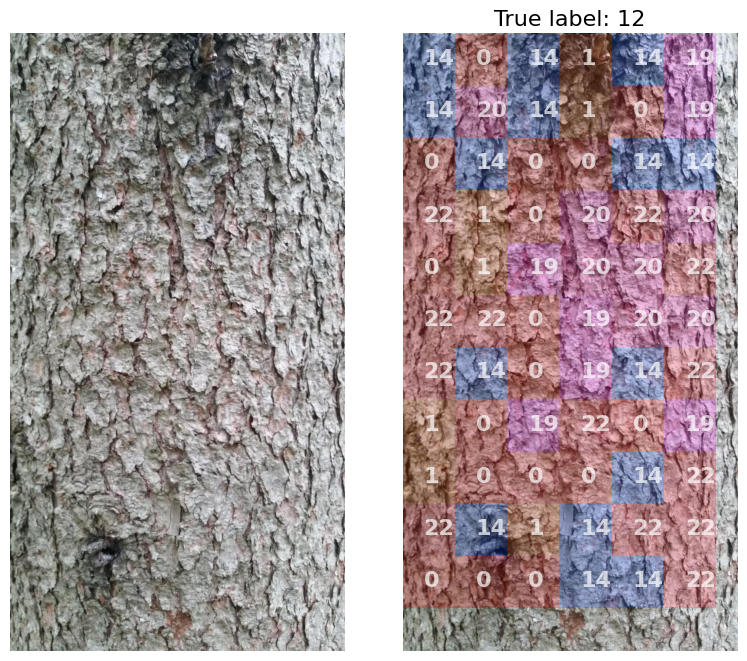

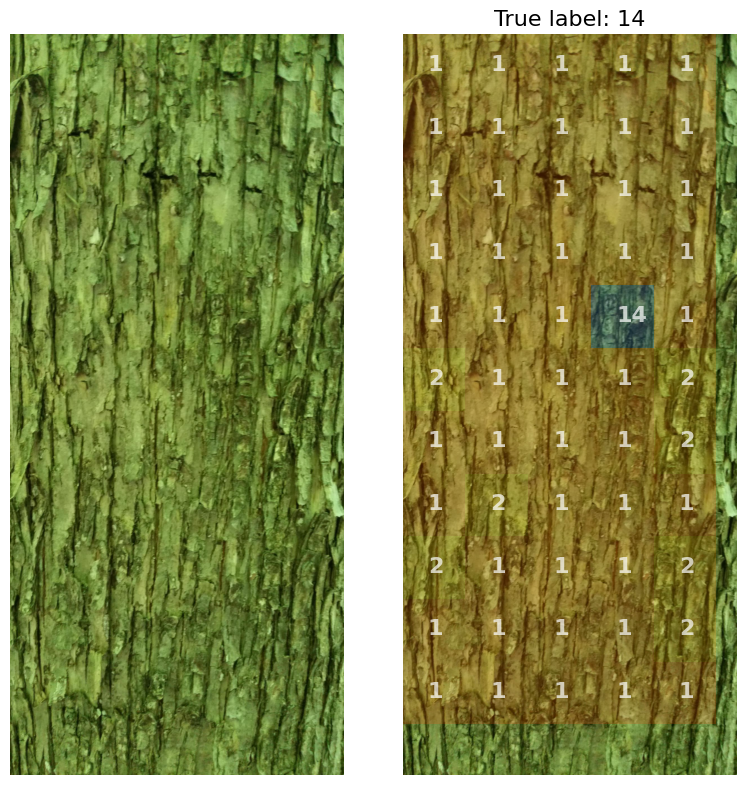

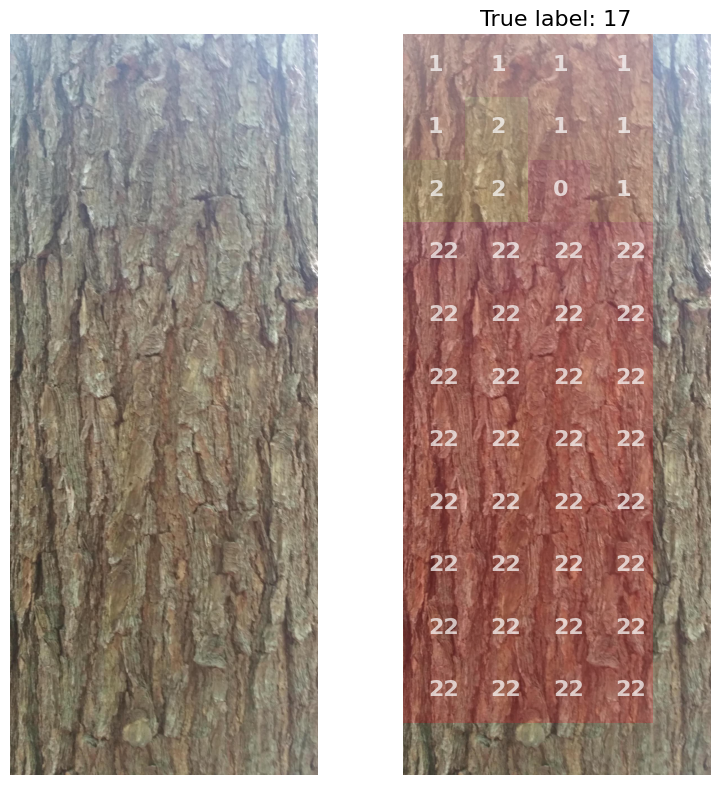

ERROR:root:local variable 'batch_outputs' referenced before assignment
2024-04-29 08:34:09.326990: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


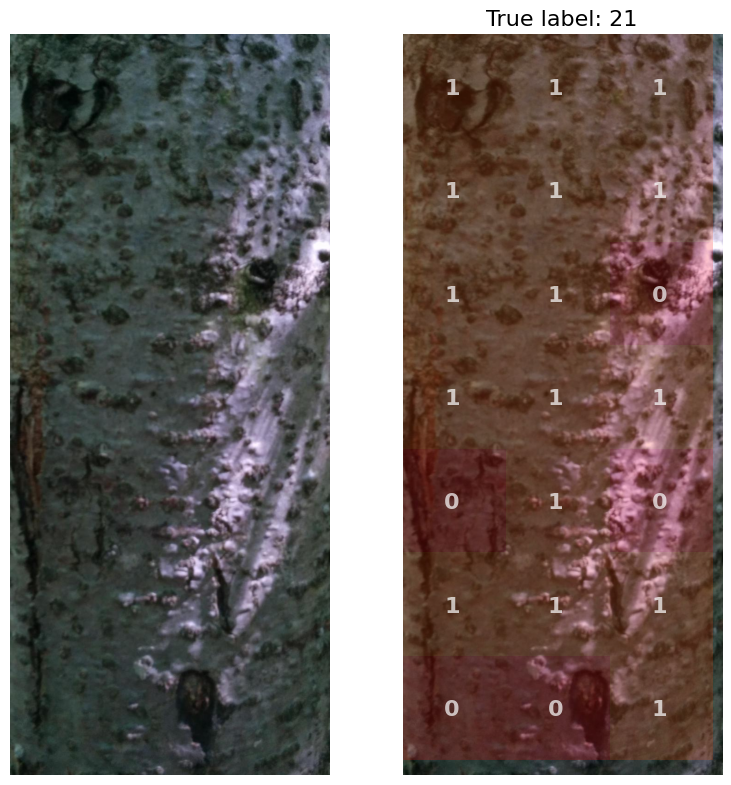

I0000 00:00:1714379727.539056  115370 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1368', 460 bytes spill stores, 348 bytes spill loads

ERROR:root:local variable 'batch_outputs' referenced before assignment
2024-04-29 08:35:48.149018: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [13]:
def slice_image(source_path):
    img = Image.open(source_path)
    
    width, height = img.size
    num_chunks_x = width // 224
    num_chunks_y = height // 224

    chunks = []
    for y in range(num_chunks_y):
        for x in range(num_chunks_x):
            left = x * 224
            top = y * 224
            right = left + 224
            bottom = top + 224
            
            chunk = img.crop((left, top, right, bottom))

            normalized_image = (np.array(chunk) * 1./255 - DATASET_MEAN) / DATASET_STD

            chunks.append(normalized_image)
    return np.array(chunks)


    
def visualize_prediction(source_path, y_pred_slices, y_true):
    image = Image.open(source_path)
    
    fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(8, 8))
    fig.tight_layout()
    ax1.imshow(image)
    ax2.imshow(image)
    
    # Determine the position to display the matrix
    width, height = image.size
    num_chunks_x = width // 224
    num_chunks_y = height // 224
    y_pred_matrix = y_pred_slices.reshape(num_chunks_y, num_chunks_x)

    cmap = plt.cm.get_cmap('hsv', 23)
    for y in range(num_chunks_y):
        for x in range(num_chunks_x):
            x_pos = x * 224
            y_pos = y * 224
            ax2.add_patch(
                patches.Rectangle(
                    (x_pos,y_pos), 224, 224, alpha=0.2, fc=cmap(y_pred_matrix[y, x])
                )
            )
            ax2.text(
                x_pos+90, y_pos+130, y_pred_matrix[y, x], fontsize=16, color='white', alpha=0.7, weight='bold'
            )
    
    ax1.axis('off')
    ax2.axis('off')
    ax2.set_title(f'True label: {y_true}',fontsize=16)
    plt.show()



def evaluate(model, test_path, class_indices):
    files = list([str(path) for path in pathlib.Path(test_path).rglob(f"./*/*")])
    classes = [str(f).split('/')[2] for f in files]
    classes_indices = [class_indices[c] for c in classes]
    total_count = 0

    y_true = np.full((len(classes), len(class_indices)), 0)
    y_true[np.arange(len(classes)), classes_indices] = 1

    y_pred = []
    chunk_size = 16
    chunks = [files[i * chunk_size:(i + 1) * chunk_size] for i in range((len(files) + chunk_size - 1) // chunk_size )]  
    failed_count = 0
    for source_paths in tqdm(chunks):
        pool = multiprocessing.Pool()
        chunk_slices = pool.map(slice_image, source_paths)
        for i, slices in enumerate(chunk_slices):
            try:
                y_pred_slices = model.predict(slices, verbose=None).argmax(axis=1)
                if total_count % 400 == 0:
                    visualize_prediction(source_paths[i], y_pred_slices, classes_indices[len(y_pred)])
                y_pred_one = np.bincount(y_pred_slices).argmax()
            except Exception as e:
                logging.error(e)
                failed_count += 1
                y_pred_one = 0
            total_count += 1
            y_pred.append(y_pred_one)

    y_pred_onehot = np.full((len(files), len(class_indices)), 0)
    y_pred_onehot[np.arange(len(files)), y_pred] = 1

    return y_true, y_pred_onehot, y_pred, failed_count

y_true, y_pred, y_pred_sparse, failed_count = evaluate(model, './dataset_split_full/test', train_ds.class_indices) 

with open('y_true.npy', 'wb') as f:
    np.save(f, y_true)
with open('y_pred.npy', 'wb') as f:
    np.save(f, y_pred)
with open('y_pred_sparse.npy', 'wb') as f:
    np.save(f, y_pred_sparse)


In [14]:
with open('y_true.npy', 'wb') as f:
    np.save(f, y_true)
with open('y_pred.npy', 'wb') as f:
    np.save(f, y_pred)
with open('y_pred_sparse.npy', 'wb') as f:
    np.save(f, y_pred_sparse)

In [15]:
m = keras.metrics.CategoricalAccuracy()
m.update_state(y_true, y_pred)
print('Test Categorical Accuracy:', m.result().numpy())
print('Images failed to process:', failed_count)

Test Categorical Accuracy: 0.20973225
Images failed to process: 14


In [16]:
test_datagen = ImageDataGenerator(
    preprocessing_function=random_crop_224
)

test_ds = test_datagen.flow_from_directory(
    './dataset_split_full/test',
    target_size = image_size,
    batch_size = batch_size,
    class_mode = 'categorical',
    subset = None,
    color_mode="rgb",
)

Found 4706 images belonging to 23 classes.


In [ ]:
model.evaluate(test_ds)

/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1714380659.443684  131451 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1398', 20 bytes spill stores, 20 bytes spill loads

I0000 00:00:1714380659.668711  131459 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1398', 380 bytes spill stores, 380 bytes spill loads

I0000 00:00:1714380659.727871  131452 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1398', 856 bytes spill stores, 856 bytes spill loads

I0000 00:00:171

36/37 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - categorical_accuracy: 0.8976 - loss: 0.4251

I0000 00:00:1714380706.123600  132175 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1398', 460 bytes spill stores, 348 bytes spill loads

I0000 00:00:1714380706.126023  132167 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1391', 16 bytes spill stores, 16 bytes spill loads

I0000 00:00:1714380706.166143  132174 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1391', 244 bytes spill stores, 244 bytes spill loads

I0000 00:00:1714380706.330648  132171 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1398', 968 bytes spill stores, 628 bytes spill loads

I0000 00:00:1714380706.406726  132173 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1391', 300 bytes spill stores, 184 bytes spill loads



37/37 ━━━━━━━━━━━━━━━━━━━━ 53s 1s/step - categorical_accuracy: 0.8979 - loss: 0.4245


[0.41278189420700073, 0.9037399291992188]